In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hotel-reviews-bookingcom/La_Veranda_Reviews-2023-01-16.csv


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')
import plotly.express as px
import plotly.graph_objects as go
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()
import warnings
warnings.filterwarnings('ignore') 
from wordcloud import WordCloud, STOPWORDS

In [3]:
df=pd.read_csv('/kaggle/input/hotel-reviews-bookingcom/La_Veranda_Reviews-2023-01-16.csv')

In [4]:
df

,Title,PositiveReview,NegativeReview,Score,GuestName,GuestCountry,RoomType,NumberOfNights,VisitDate,GroupType,PropertyResponse
0,Wonderful place to stay.,"New, comfortable apartments, close to the airp...",Nothing at all.,10.0,Olga,Norway,Budget Twin Room,1 night,June 2022,Solo traveler,NaN
1,It was superb,We had a really pleasant stay! The staff was v...,NaN,10.0,Iwona,Poland,Double Room,3 nights,December 2022,Family,NaN
2,Very Good,the location is great and near the airport. bu...,NaN,8.0,Ruijia,Sweden,Double Room,1 night,December 2022,Solo traveler,NaN
3,Wonderful,Great stuff\nGreat Quality/price\nClean,NaN,9.0,Theprincem,United Kingdom,Double Room with Balcony,2 nights,September 2022,Solo traveler,NaN
4,"Fantastic value for a new, modern and spotless...","Clean and modern with very comfortable beds, i...",NaN,10.0,M,Switzerland,Family Suite with Balcony,1 night,October 2022,Family,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1518,Exceptional,NaN,NaN,10.0,Anonymous,Israel,NaN,5 nights,September 2021,Couple,NaN
1519,Wonderful,NaN,NaN,9.0,Anonymous,Czech Republic,NaN,1 night,September 2021,Group,NaN
1520,Very Good,NaN,NaN,8.0,Anonymous,Sweden,NaN,1 night,August 2021,Couple,NaN
1521,Wonderful,NaN,NaN,9.0,Anonymous,Germany,NaN,3 nights,September 2021,Solo traveler,NaN


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1523 entries, 0 to 1522
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Title             1521 non-null   object 
 1   PositiveReview    775 non-null    object 
 2   NegativeReview    435 non-null    object 
 3   Score             1523 non-null   float64
 4   GuestName         1523 non-null   object 
 5   GuestCountry      1523 non-null   object 
 6   RoomType          1460 non-null   object 
 7   NumberOfNights    1523 non-null   object 
 8   VisitDate         1523 non-null   object 
 9   GroupType         1523 non-null   object 
 10  PropertyResponse  123 non-null    object 
dtypes: float64(1), object(10)
memory usage: 131.0+ KB


In [6]:
df.isna().sum()

Title                  2
PositiveReview       748
NegativeReview      1088
Score                  0
GuestName              0
GuestCountry           0
RoomType              63
NumberOfNights         0
VisitDate              0
GroupType              0
PropertyResponse    1400
dtype: int64

In [7]:
df.nunique()

Title                455
PositiveReview       768
NegativeReview       378
Score                 12
GuestName           1055
GuestCountry          68
RoomType               7
NumberOfNights        15
VisitDate             20
GroupType              4
PropertyResponse     117
dtype: int64

In [8]:
df.describe()

,Score
count,1523.000000
mean,8.973802
std,1.300178
min,1.000000
25%,8.000000
50%,9.000000
75%,10.000000
max,10.000000


# Distribution by score

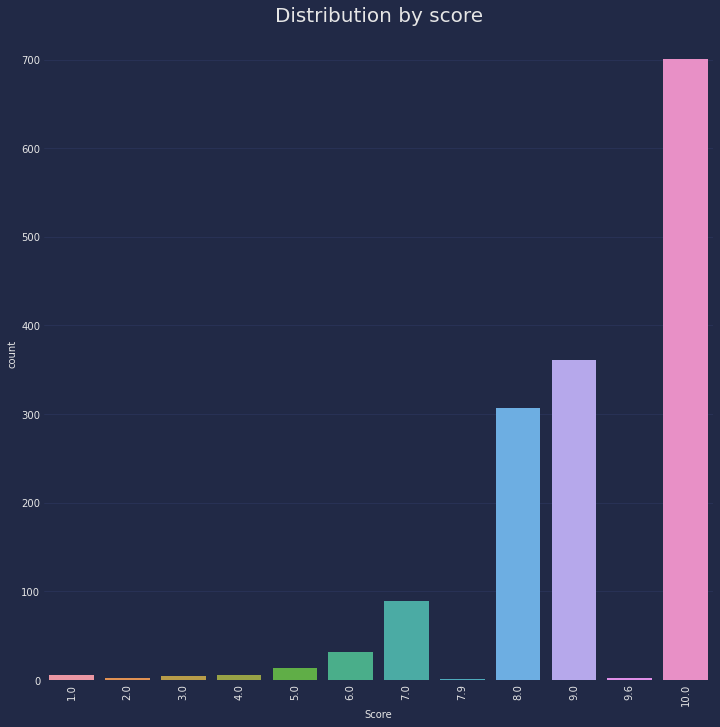

In [9]:
plt.figure(figsize=(12,12))
sns.countplot(data=df, x='Score')
plt.xticks(rotation=90)
plt.title('Distribution by score',fontsize = 20)
plt.show()

In [10]:
fig = px.histogram(df, x='Score',color='Score',marginal='box',hover_data=df.columns,title= 'Distribution by score', width=1000, height=500,template='plotly_dark')
fig.show()

In [11]:
df['Score'].value_counts()

10.0    701
9.0     361
8.0     307
7.0      89
6.0      32
5.0      13
4.0       6
1.0       5
3.0       4
9.6       2
2.0       2
7.9       1
Name: Score, dtype: int64

# Distribution by room type

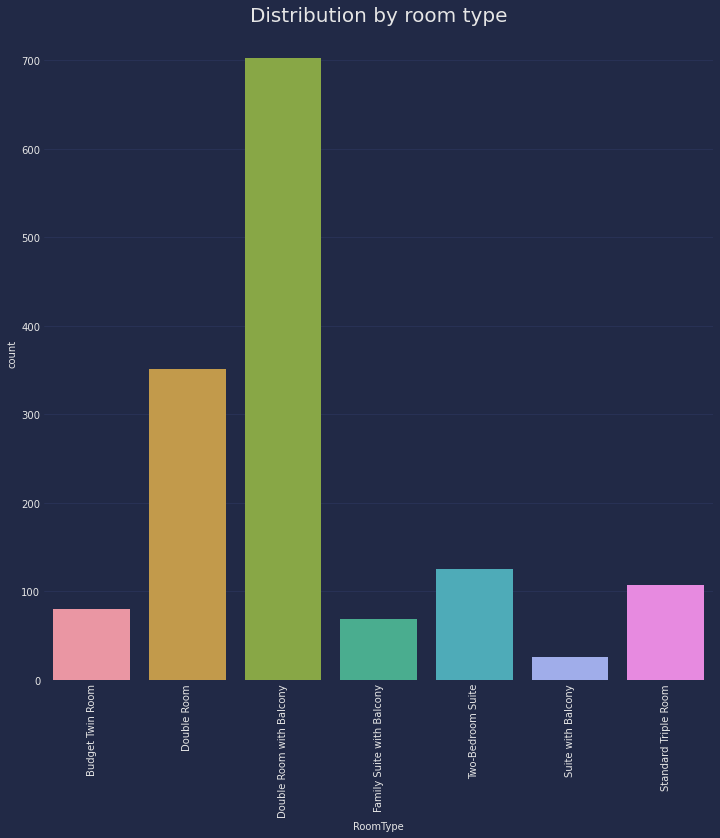

In [12]:
plt.figure(figsize=(12,12))
sns.countplot(data=df,x='RoomType')
plt.xticks(rotation=90)
plt.title('Distribution by room type',fontsize = 20)
plt.show()

In [13]:
fig = px.histogram(df, x='RoomType',color='RoomType',marginal='box',hover_data=df.columns,title= 'Distribution by room type', width=1000, height=500,template='plotly_dark')
fig.show()

In [14]:
df['RoomType'].value_counts()

Double Room with Balcony     702
Double Room                  351
Two-Bedroom Suite            125
Standard Triple Room         107
Budget Twin Room              80
Family Suite with Balcony     69
Suite with Balcony            26
Name: RoomType, dtype: int64

# Distribution by number of nights

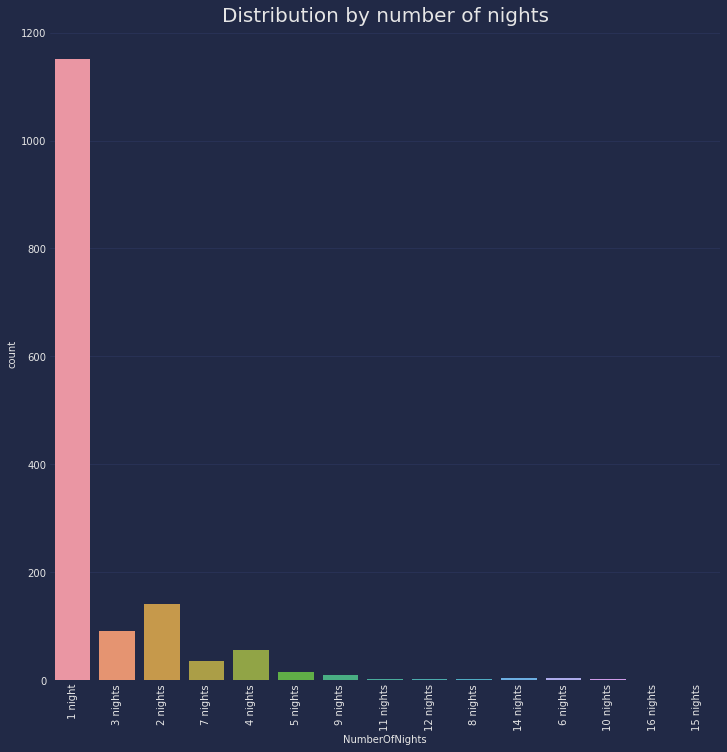

In [15]:
plt.figure(figsize=(12,12))
sns.countplot(data=df,x='NumberOfNights')
plt.xticks(rotation=90)
plt.title('Distribution by number of nights',fontsize = 20)
plt.show()

In [16]:
fig = px.histogram(df, x='NumberOfNights',color='NumberOfNights',marginal='box',hover_data=df.columns,title= 'Distribution by number of nights', width=1000, height=500,template='plotly_dark')
fig.show()

In [17]:
df['NumberOfNights'].value_counts()

1 night      1151
2 nights      142
3 nights       92
4 nights       57
7 nights       35
5 nights       15
9 nights       10
6 nights        5
14 nights       4
11 nights       3
8 nights        3
12 nights       2
10 nights       2
16 nights       1
15 nights       1
Name: NumberOfNights, dtype: int64

# Distribution by visit date

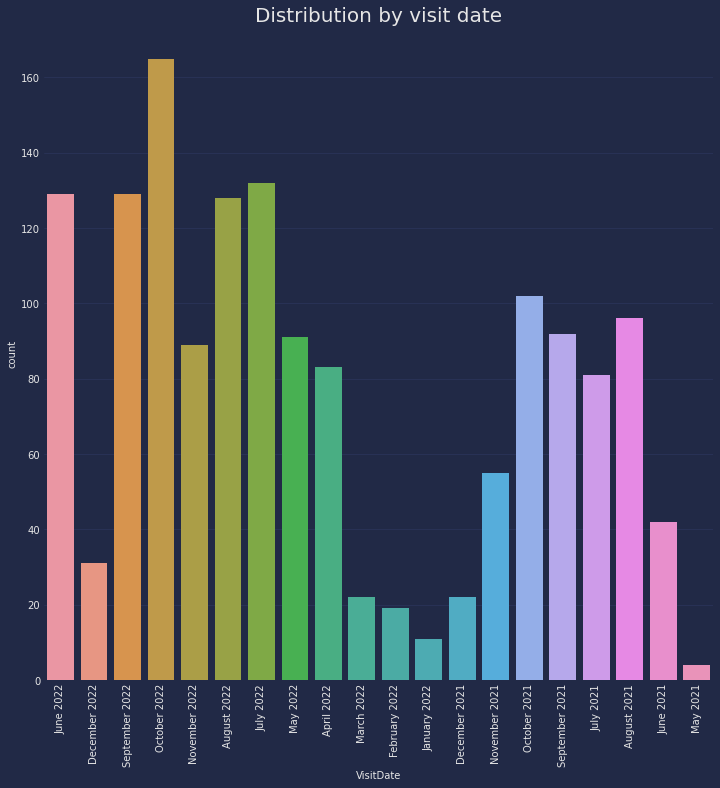

In [18]:
plt.figure(figsize=(12,12))
sns.countplot(data=df,x='VisitDate')
plt.xticks(rotation=90)
plt.title('Distribution by visit date',fontsize = 20)
plt.show()

In [19]:
fig = px.histogram(df, x='VisitDate',color='VisitDate',marginal='box',hover_data=df.columns,title= 'Distribution by visit date', width=1000, height=500,template='plotly_dark')
fig.show()

In [20]:
df['VisitDate'].value_counts()

October 2022      165
July 2022         132
June 2022         129
September 2022    129
August 2022       128
October 2021      102
August 2021        96
September 2021     92
May 2022           91
November 2022      89
April 2022         83
July 2021          81
November 2021      55
June 2021          42
December 2022      31
December 2021      22
March 2022         22
February 2022      19
January 2022       11
May 2021            4
Name: VisitDate, dtype: int64

# Distribution by group type

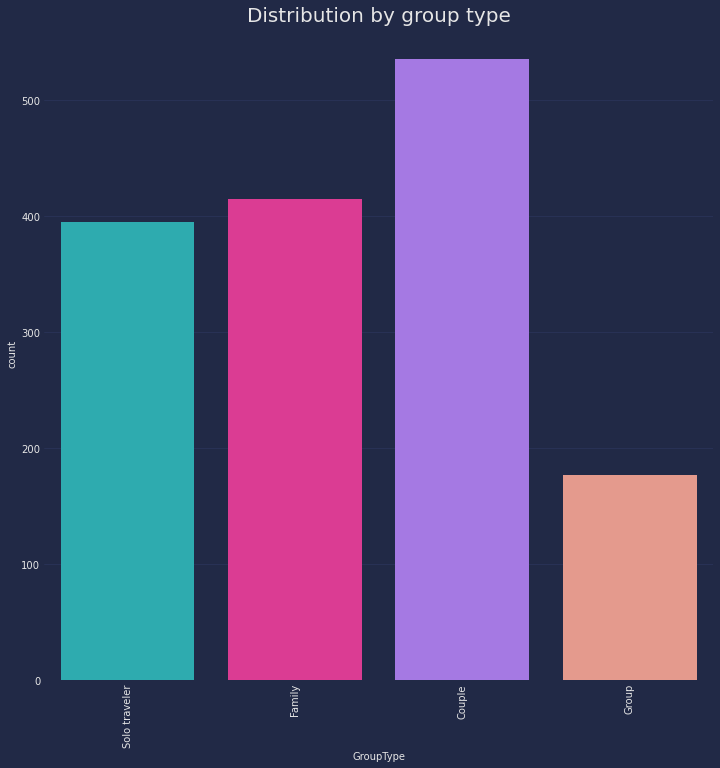

In [21]:
plt.figure(figsize=(12,12))
sns.countplot(data=df,x='GroupType')
plt.xticks(rotation=90)
plt.title('Distribution by group type',fontsize = 20)
plt.show()

In [22]:
fig = px.histogram(df, x='GroupType',color='GroupType',marginal='box',hover_data=df.columns,title= 'Distribution by group type', width=1000, height=500,template='plotly_dark')
fig.show()

In [23]:
df['GroupType'].value_counts()

Couple           536
Family           415
Solo traveler    395
Group            177
Name: GroupType, dtype: int64

# Distribution by guest counrty

In [24]:
fig=px.choropleth(data_frame=df,locations=df['GuestCountry'],locationmode='country names',color=df['Score'],animation_frame=df['VisitDate'],animation_group=df['Score'] ,template='plotly_dark')
fig.update_layout(dict1={'title':'Distribution of the rating relative to countries'})
fig.show() 

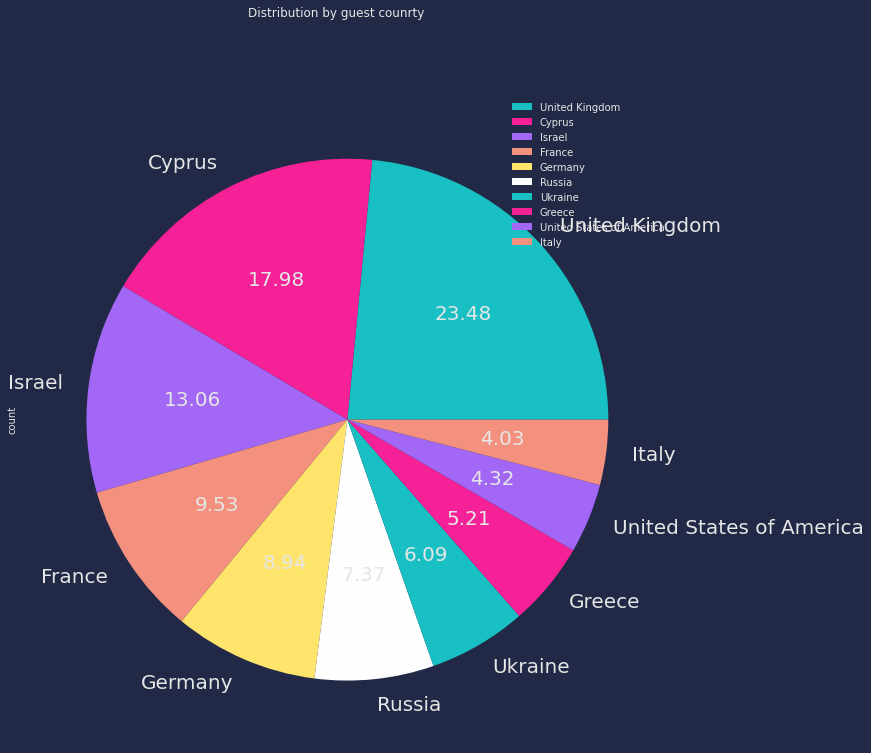

In [25]:
df.groupby('GuestCountry')['GuestCountry'].agg(['count']).sort_values(by='count',ascending=False).head(10).plot(kind='pie', subplots=True, autopct='%1.2f', figsize=(12,12), title= 'Distribution by guest counrty', fontsize = 20)
plt.show()

In [26]:
fig = px.histogram(df, x='GuestCountry',color='GuestCountry',marginal='box',hover_data=df.columns,title= 'Distribution by guest counrty', width=1000, height=500,template='plotly_dark')
fig.show()

In [27]:
df['GuestCountry'].value_counts()

United Kingdom        239
Cyprus                183
Israel                133
France                 97
Germany                91
                     ... 
India                   1
New Zealand             1
Abkhazia, ​Georgia      1
Angola                  1
Nigeria                 1
Name: GuestCountry, Length: 68, dtype: int64

# Distribution of the rating depending on the country

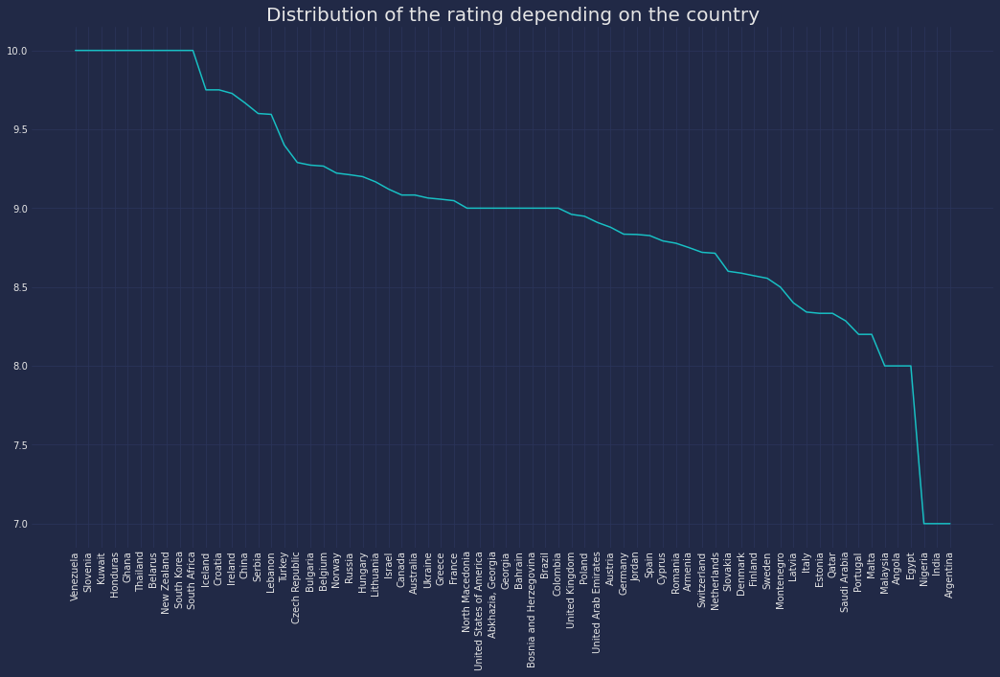

In [28]:
CS = df.groupby(['GuestCountry'])['Score'].mean().reset_index().sort_values(by='Score',ascending=False)
plt.figure(figsize=(18,10))
plt.xticks(rotation=90)
plt.plot(CS['GuestCountry'],CS['Score'])
plt.title('Distribution of the rating depending on the country',fontsize = 20)
plt.show()

In [29]:
fig= px.histogram(df, x='GuestCountry', color='GuestCountry',y='Score',marginal='box',template='plotly_dark',hover_data=df.columns,title= 'Distribution of the rating depending on the country', width=1000, height=500)
fig.show()

In [30]:
df.groupby('GuestCountry', as_index=False).agg({'Score' : 'mean'}).sort_values('Score', ascending=False)

,GuestCountry,Score
67,Venezuela,10.0
55,Slovenia,10.0
35,Kuwait,10.0
27,Honduras,10.0
25,Ghana,10.0
...,...,...
1,Angola,8.0
19,Egypt,8.0
44,Nigeria,7.0
30,India,7.0


# Distribution of the rating depending on the type of room

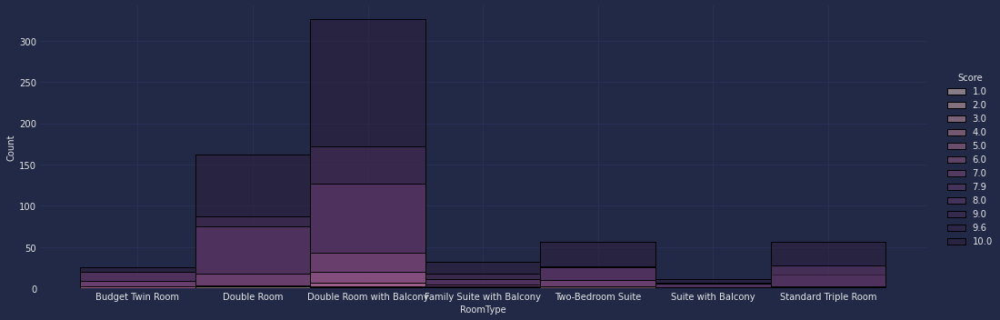

In [31]:
sns.displot(df, x='RoomType',bins=70, hue='Score',aspect=2.9)
plt.show()

In [32]:
fig = px.violin(df, y='Score', x='RoomType', color='RoomType', box=True, points='all',hover_data=df.columns, width=1200, height=600 ,template='plotly_dark', title= 'Distribution of the rating depending on the type of room')
fig.show()

In [33]:
df.groupby('RoomType', as_index=False).agg({'Score' : 'mean'}).sort_values('Score', ascending=False)

,RoomType,Score
4,Standard Triple Room,9.154206
1,Double Room,9.011396
2,Double Room with Balcony,8.988034
3,Family Suite with Balcony,8.927536
5,Suite with Balcony,8.923077
6,Two-Bedroom Suite,8.912000
0,Budget Twin Room,8.637500


# Distribution of the number of nights depending on the type of room

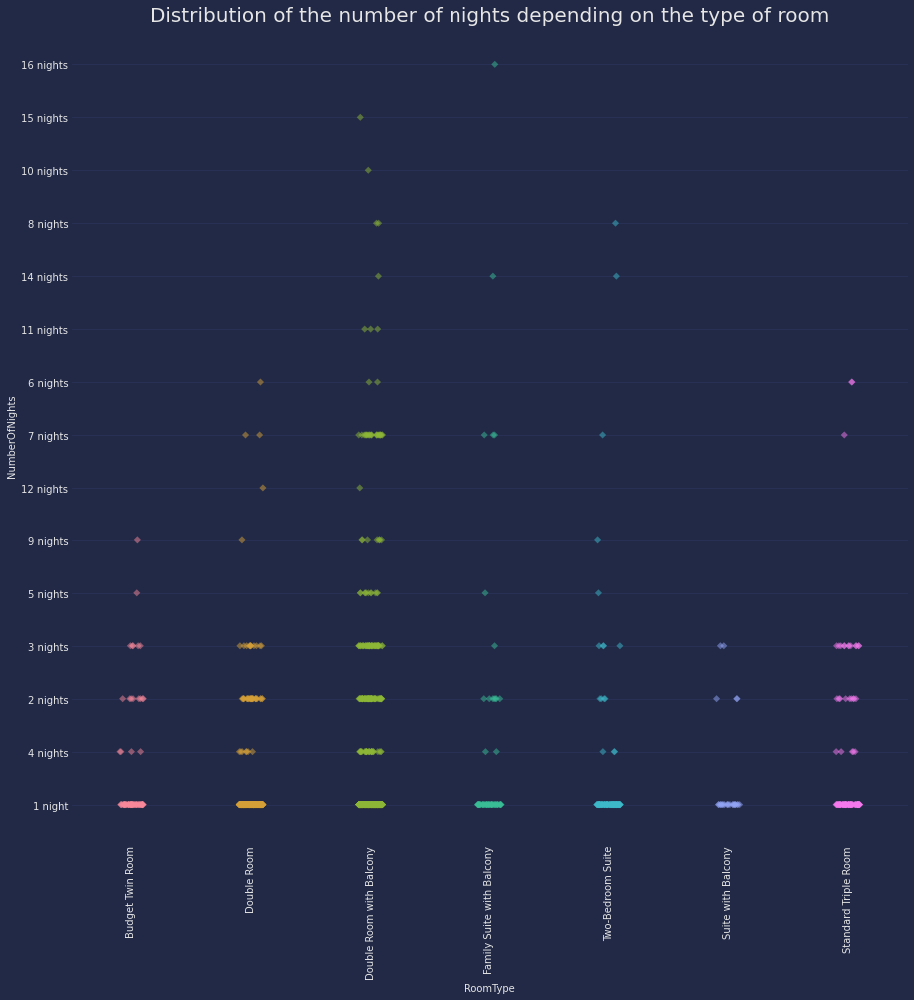

In [34]:
plt.subplots(figsize=(15,15))
plt.xticks(rotation=90)
sns.stripplot(y='NumberOfNights', x='RoomType', data=df, marker='D', alpha=0.5)
plt.title('Distribution of the number of nights depending on the type of room',fontsize = 20)
plt.show()

In [35]:
fig = px.violin(df, y='NumberOfNights', x='RoomType',color='RoomType' ,box=True, points='all',hover_data=df.columns, width=1200, height=600 ,template='plotly_dark', title='Distribution of the number of nights depending on the type of room')
fig.show()

In [36]:
df.groupby('RoomType', as_index=False).agg({'NumberOfNights' : 'count'}).sort_values('NumberOfNights', ascending=False)

,RoomType,NumberOfNights
2,Double Room with Balcony,702
1,Double Room,351
6,Two-Bedroom Suite,125
4,Standard Triple Room,107
0,Budget Twin Room,80
3,Family Suite with Balcony,69
5,Suite with Balcony,26


In [37]:
df.groupby('NumberOfNights')['RoomType'].agg(['count']).sort_values(by='count',ascending=False)

,count
NumberOfNights,
1 night,1111
2 nights,135
3 nights,88
4 nights,52
7 nights,31
5 nights,14
9 nights,10
6 nights,5
11 nights,3


# Distribution of room types depending on the guest's country

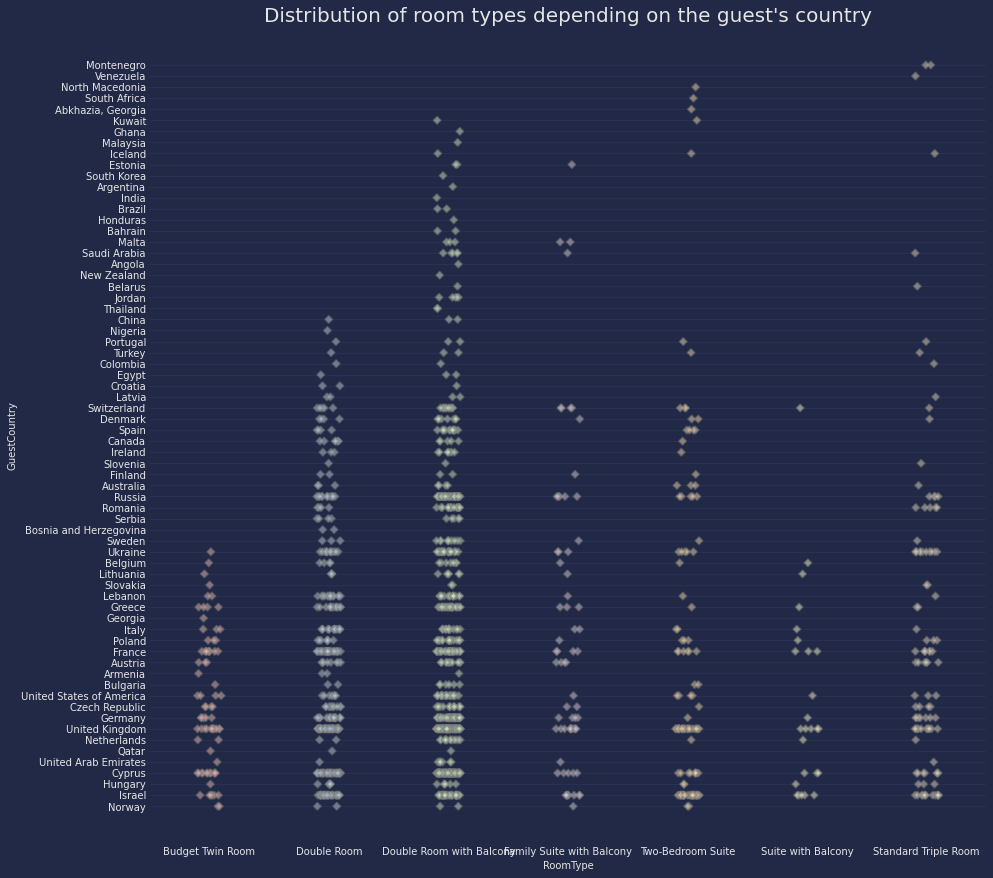

In [38]:
plt.subplots(figsize=(15,15))
plt.xticks(rotation=0)
sns.stripplot(y='GuestCountry', x='RoomType', data=df, palette='Pastel1', s=5, marker='D', linewidth=2, alpha=0.5)
plt.title("Distribution of room types depending on the guest's country",fontsize = 20)
plt.show()

In [39]:
fig = px.box(df, x='RoomType', color='RoomType', y='GuestCountry', title="Distribution of room types depending on the guest's country", width=1200, height=600 ,template='plotly_dark')
fig.show()

In [40]:
df.groupby('RoomType', as_index=False).agg({'GuestCountry' : 'count'}).sort_values('GuestCountry', ascending=False)

,RoomType,GuestCountry
2,Double Room with Balcony,702
1,Double Room,351
6,Two-Bedroom Suite,125
4,Standard Triple Room,107
0,Budget Twin Room,80
3,Family Suite with Balcony,69
5,Suite with Balcony,26


# Distribution of room types depending on group types

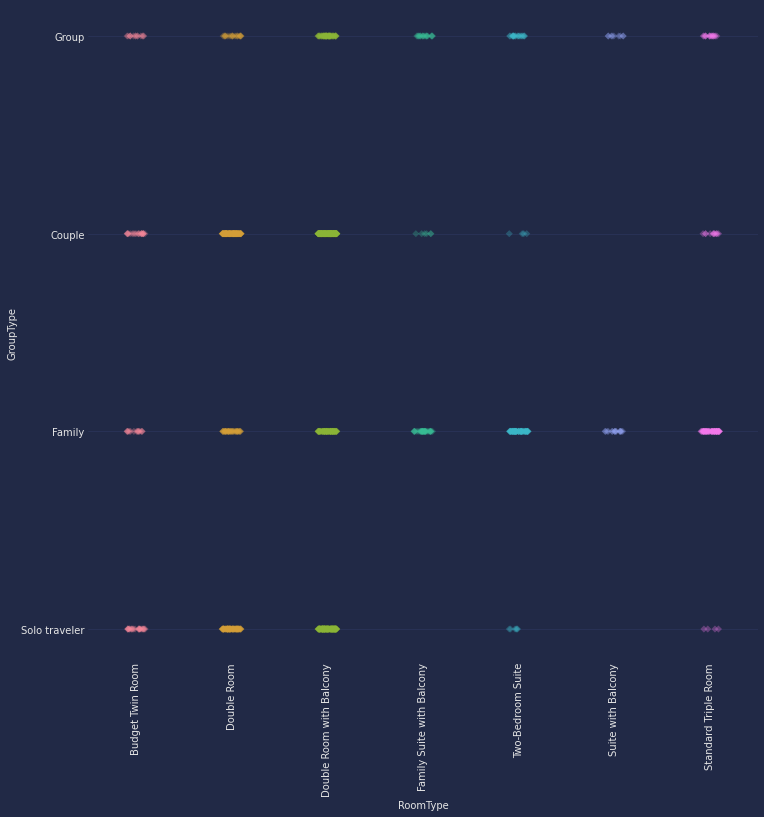

In [41]:
plt.subplots(figsize=(12,12))
plt.xticks(rotation=90)
sns.stripplot(data=df, y='GroupType', x='RoomType',marker='D', alpha=0.3)
plt.show()

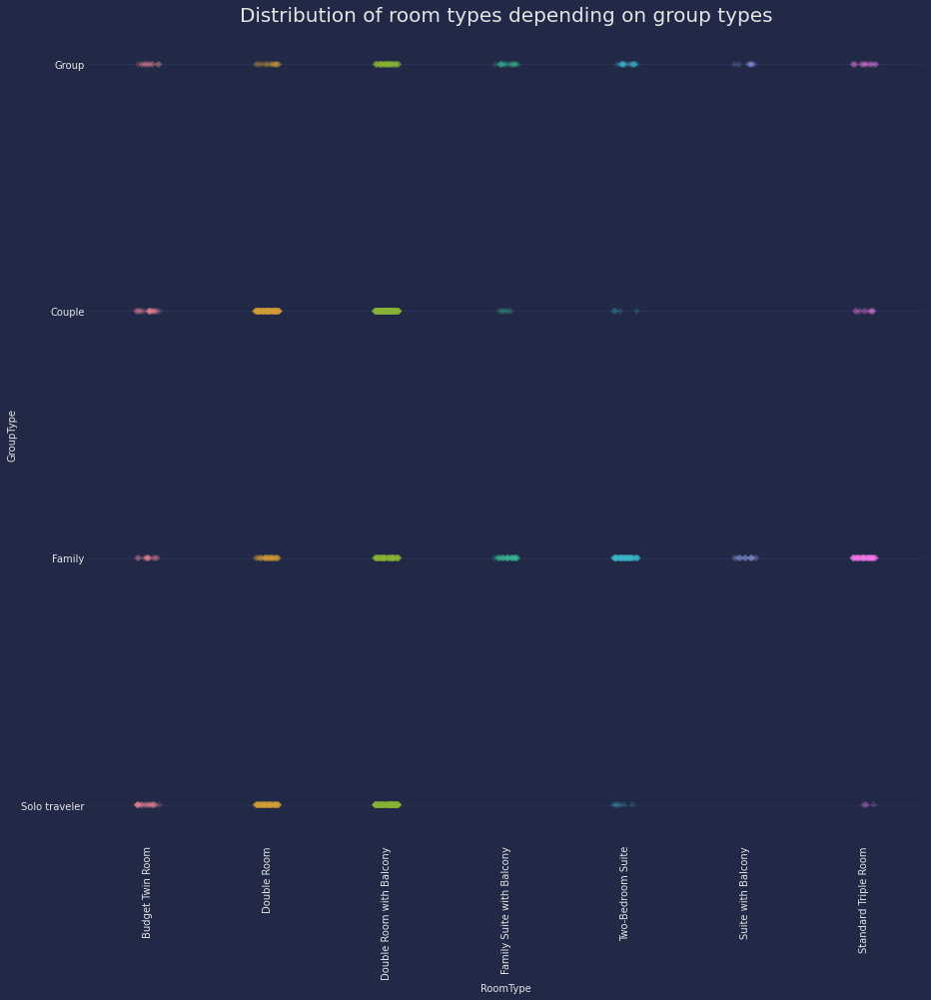

In [42]:
plt.subplots(figsize=(15,15))
plt.xticks(rotation=90)
sns.stripplot(y='GroupType', x='RoomType', data=df, marker='D', alpha=0.2)
plt.title('Distribution of room types depending on group types',fontsize = 20)
plt.show()

In [43]:
fig = px.box(df, x='RoomType', color='RoomType', y='GroupType', title='Distribution of room types depending on group types', width=1200, height=600 ,template='plotly_dark')
fig.show()

In [44]:
df.groupby('RoomType', as_index=False).agg({'GroupType' : 'count'}).sort_values('GroupType', ascending=False)

,RoomType,GroupType
2,Double Room with Balcony,702
1,Double Room,351
6,Two-Bedroom Suite,125
4,Standard Triple Room,107
0,Budget Twin Room,80
3,Family Suite with Balcony,69
5,Suite with Balcony,26


In [45]:
df.groupby('GroupType', as_index=False).agg({'RoomType' : 'count'}).sort_values('RoomType', ascending=False)

,GroupType,RoomType
0,Couple,511
1,Family,396
3,Solo traveler,382
2,Group,171


# Distribution of the rating depending on the date of arrival

In [46]:
df['VisitDate']= pd.to_datetime(df['VisitDate'])

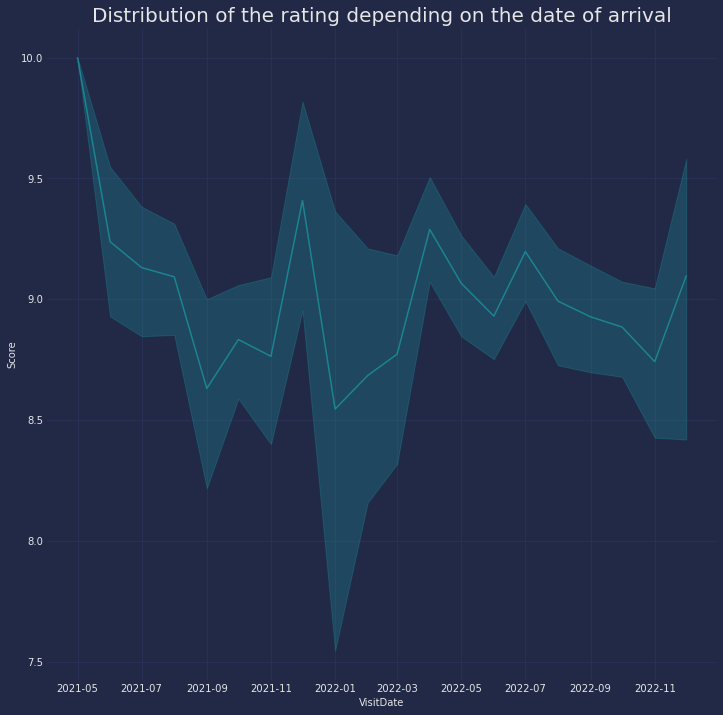

In [47]:
plt.figure(figsize=(12,12))
sns.lineplot(data=df, x='VisitDate', y='Score', alpha=0.5)
plt.title('Distribution of the rating depending on the date of arrival',fontsize = 20)
plt.show()

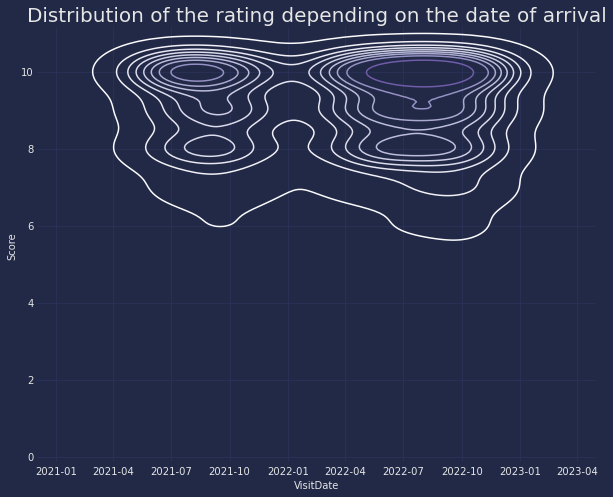

In [48]:
plt.figure(figsize=(10,8))
sns.kdeplot(df['VisitDate'],df['Score'],shade=False,cmap='Purples', shade_lowest=False)
plt.title('Distribution of the rating depending on the date of arrival',fontsize = 20)
plt.show()

In [49]:
fig = px.histogram(df, x='VisitDate', y='Score', color='Score',barmode='relative',marginal='box', title='Distribution of the rating depending on the date of arrival', width=1200, height=600 ,template='plotly_dark')
fig.show()

In [50]:
df.groupby('VisitDate')['Score'].agg(['count','mean']).sort_values(by='VisitDate',ascending=False)

,count,mean
VisitDate,,
2022-12-01,31,9.096774
2022-11-01,89,8.741573
2022-10-01,165,8.884848
2022-09-01,129,8.927132
2022-08-01,128,8.992188
2022-07-01,132,9.196970
2022-06-01,129,8.930233
2022-05-01,91,9.065934
2022-04-01,83,9.289157


In [51]:
df.groupby('VisitDate', as_index=False).agg({'Score' : 'mean'}).sort_values('Score', ascending=False)

,VisitDate,Score
0,2021-05-01,10.000000
7,2021-12-01,9.409091
11,2022-04-01,9.289157
1,2021-06-01,9.238095
14,2022-07-01,9.196970
2,2021-07-01,9.130864
19,2022-12-01,9.096774
3,2021-08-01,9.092708
12,2022-05-01,9.065934
15,2022-08-01,8.992188


# Distribution of the rating depending on the type of group

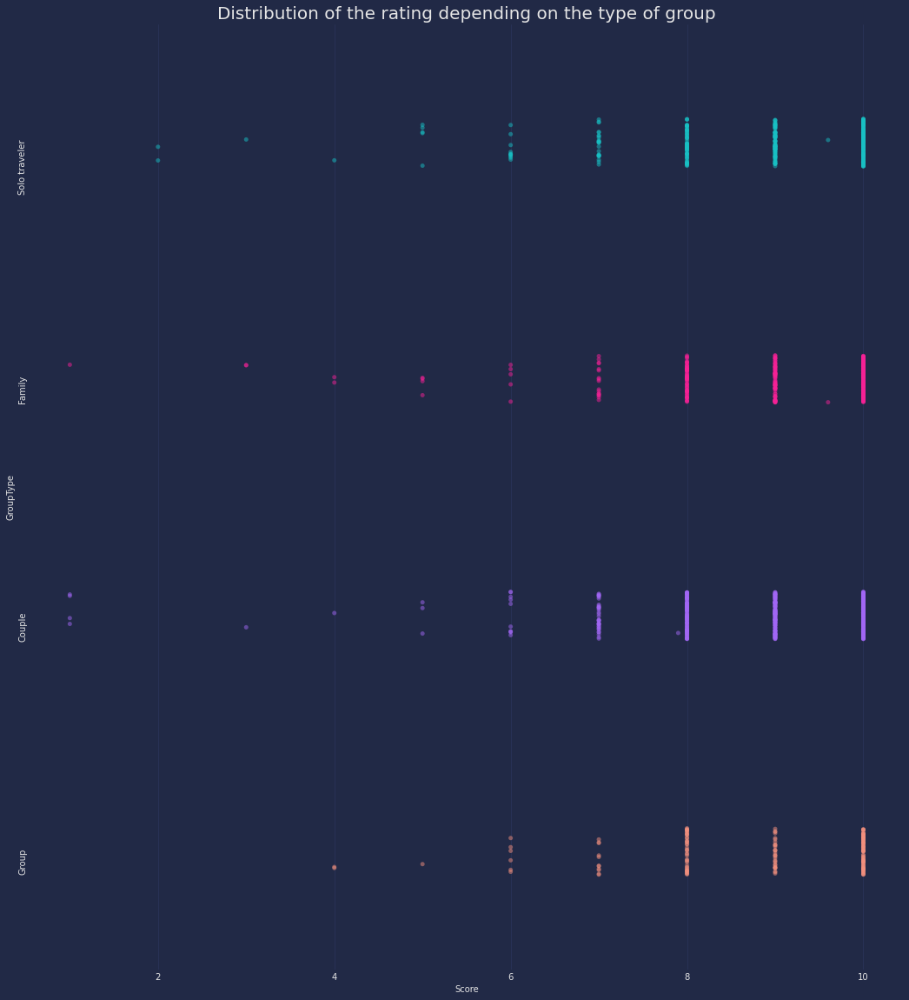

In [52]:
plt.subplots(figsize=(18,20))
plt.yticks(rotation=90)
sns.stripplot(y='GroupType', x='Score', data=df, alpha=0.5)
plt.title('Distribution of the rating depending on the type of group',fontsize = 20)
plt.show()

In [53]:
fig = px.box(df, x='Score', color='GroupType', y='GroupType', title='Distribution of the rating depending on the type of group', width=1200, height=600 ,template='plotly_dark')
fig.show()

In [54]:
df.groupby('GroupType', as_index=False).agg({'Score' : 'mean'}).sort_values('Score', ascending=False)

,GroupType,Score
1,Family,9.131566
3,Solo traveler,8.943291
2,Group,8.903955
0,Couple,8.897201


# Prediction

In [55]:
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import pickle
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import LabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.regularizers import l1, l2
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB

In [56]:
df['PositiveReview'] = df['PositiveReview'].fillna('')

In [57]:
df['NegativeReview'] = df['NegativeReview'].fillna('')

In [58]:
df['Length'] = df['PositiveReview'].apply(len)
df.head()

,Title,PositiveReview,NegativeReview,Score,GuestName,GuestCountry,RoomType,NumberOfNights,VisitDate,GroupType,PropertyResponse,Length
0,Wonderful place to stay.,"New, comfortable apartments, close to the airp...",Nothing at all.,10.0,Olga,Norway,Budget Twin Room,1 night,2022-06-01,Solo traveler,NaN,252
1,It was superb,We had a really pleasant stay! The staff was v...,,10.0,Iwona,Poland,Double Room,3 nights,2022-12-01,Family,NaN,366
2,Very Good,the location is great and near the airport. bu...,,8.0,Ruijia,Sweden,Double Room,1 night,2022-12-01,Solo traveler,NaN,67
3,Wonderful,Great stuff\nGreat Quality/price\nClean,,9.0,Theprincem,United Kingdom,Double Room with Balcony,2 nights,2022-09-01,Solo traveler,NaN,37
4,"Fantastic value for a new, modern and spotless...","Clean and modern with very comfortable beds, i...",,10.0,M,Switzerland,Family Suite with Balcony,1 night,2022-10-01,Family,NaN,139


In [59]:
df['Length2'] = df['NegativeReview'].apply(len)
df.head()

,Title,PositiveReview,NegativeReview,Score,GuestName,GuestCountry,RoomType,NumberOfNights,VisitDate,GroupType,PropertyResponse,Length,Length2
0,Wonderful place to stay.,"New, comfortable apartments, close to the airp...",Nothing at all.,10.0,Olga,Norway,Budget Twin Room,1 night,2022-06-01,Solo traveler,NaN,252,15
1,It was superb,We had a really pleasant stay! The staff was v...,,10.0,Iwona,Poland,Double Room,3 nights,2022-12-01,Family,NaN,366,0
2,Very Good,the location is great and near the airport. bu...,,8.0,Ruijia,Sweden,Double Room,1 night,2022-12-01,Solo traveler,NaN,67,0
3,Wonderful,Great stuff\nGreat Quality/price\nClean,,9.0,Theprincem,United Kingdom,Double Room with Balcony,2 nights,2022-09-01,Solo traveler,NaN,37,0
4,"Fantastic value for a new, modern and spotless...","Clean and modern with very comfortable beds, i...",,10.0,M,Switzerland,Family Suite with Balcony,1 night,2022-10-01,Family,NaN,139,0


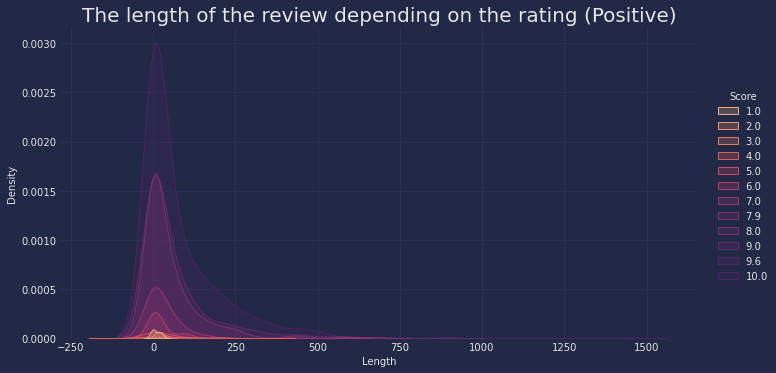

In [60]:
sns.displot(data=df, x='Length', hue='Score', palette='flare', kind='kde', fill=True, aspect=2)
plt.title('The length of the review depending on the rating (Positive)',fontsize = 20)
plt.show()

In [61]:
df.groupby('Score', as_index=False).agg({'Length' : 'mean'}).sort_values('Score', ascending=False)

,Score,Length
11,10.0,81.517832
10,9.6,63.000000
9,9.0,66.398892
8,8.0,52.736156
7,7.9,211.000000
6,7.0,36.303371
5,6.0,27.000000
4,5.0,36.384615
3,4.0,64.666667
2,3.0,21.750000


In [62]:
df.groupby('Score', as_index=False).agg({'Length' : 'mean'}).sort_values('Length', ascending=False)

,Score,Length
7,7.9,211.000000
11,10.0,81.517832
9,9.0,66.398892
3,4.0,64.666667
10,9.6,63.000000
8,8.0,52.736156
4,5.0,36.384615
6,7.0,36.303371
5,6.0,27.000000
2,3.0,21.750000


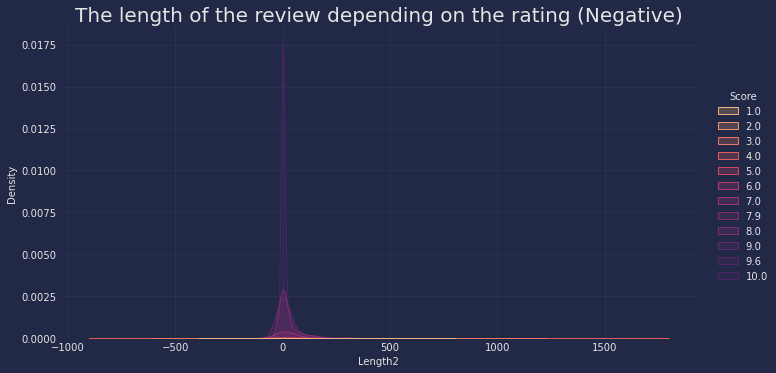

In [63]:
sns.displot(data=df, x='Length2', hue='Score', palette='flare', kind='kde', fill=True, aspect=2)
plt.title('The length of the review depending on the rating (Negative)',fontsize = 20)
plt.show()

In [64]:
df.groupby('Score', as_index=False).agg({'Length2' : 'mean'}).sort_values('Length2', ascending=False)

,Score,Length2
3,4.0,343.000000
7,7.9,292.000000
2,3.0,180.000000
4,5.0,125.846154
0,1.0,107.400000
5,6.0,86.843750
6,7.0,46.808989
9,9.0,29.537396
8,8.0,29.224756
10,9.6,18.000000


In [65]:
df.groupby('Score', as_index=False).agg({'Length2' : 'mean'}).sort_values('Score', ascending=False)

,Score,Length2
11,10.0,9.509272
10,9.6,18.000000
9,9.0,29.537396
8,8.0,29.224756
7,7.9,292.000000
6,7.0,46.808989
5,6.0,86.843750
4,5.0,125.846154
3,4.0,343.000000
2,3.0,180.000000


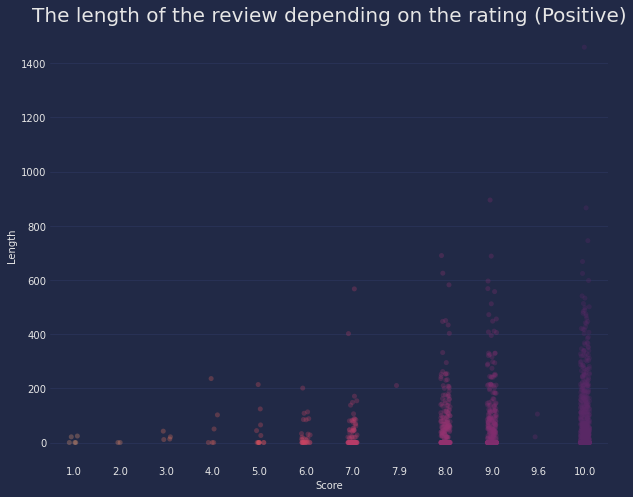

In [66]:
plt.figure(figsize=(10,8))
sns.stripplot(data=df, x='Score', y='Length', palette='flare', alpha=0.3)
plt.title('The length of the review depending on the rating (Positive)',fontsize = 20)
plt.show()

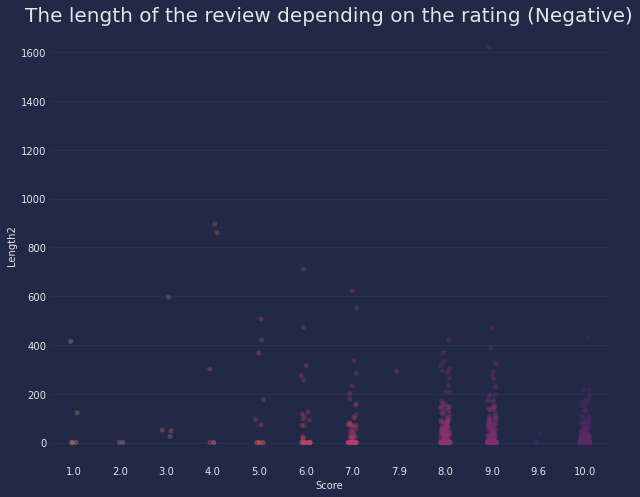

In [67]:
plt.figure(figsize=(10,8))
sns.stripplot(data=df, x='Score', y='Length2', palette='flare', alpha=0.3)
plt.title('The length of the review depending on the rating (Negative)',fontsize = 20)
plt.show()

In [68]:
def rating(score):
    if score >= 6:
        return 'Good'
    elif score == 5:
        return 'Netral'
    else:
        return 'Bad'

In [69]:
df['Score'] = df['Score'].apply(rating)

In [70]:
print('Original:')
print(df['Score'][0])
print()
sentence = []
for word in df['Score'][0].split():
    stemmer = SnowballStemmer('english')
    sentence.append(stemmer.stem(word))
print('Stemming:')
print(' '.join(sentence))
print()
sentence = []
for word in df['Score'][0].split():
    lemmatizer = WordNetLemmatizer()
    sentence.append(lemmatizer.lemmatize(word, 'v'))
print('Lemmatization:')
print(' '.join(sentence))

Original:
Good

Stemming:
good

Lemmatization:
Good


In [71]:
def cleaning(text):
    clean_text = text.translate(str.maketrans('','',string.punctuation)).lower()
    clean_text = [word for word in clean_text.split() if word not in stopwords.words('english')]
    sentence = []
    for word in clean_text:
        lemmatizer = WordNetLemmatizer()
        sentence.append(lemmatizer.lemmatize(word, 'v'))
    return ' '.join(sentence)

In [72]:
df['Score'] = df['Score'].apply(cleaning)

In [73]:
length = df['Length'].sum()

In [74]:
length2 = df['Length2'].sum()

In [75]:
df['Length'] = df['Score'].apply(len)
new_length = df['Length'].sum()
df['Length2'] = df['Score'].apply(len)
new_length2 = df['Length2'].sum()
print('Total text length before cleaning: {}'.format(length))
print('Total text length after cleaning: {}'.format(new_length))
print('Total text length before cleaning: {}'.format(length2))
print('Total text length after cleaning: {}'.format(new_length2))

Total text length before cleaning: 102729
Total text length after cleaning: 6101
Total text length before cleaning: 38525
Total text length after cleaning: 6101


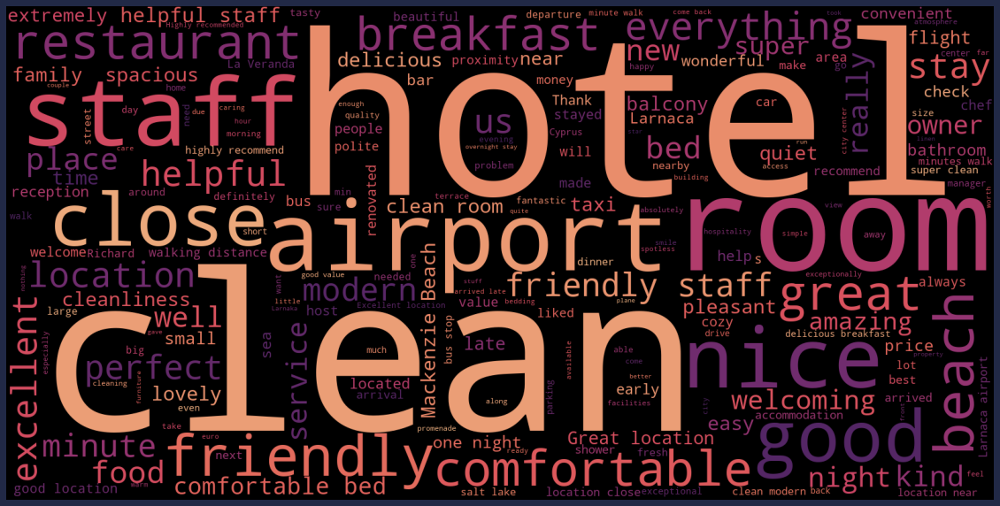

In [76]:
plt.figure(figsize=(20,20))
Word_Cloud = WordCloud(max_words=1000, min_font_size=10,height=800,width=1600,background_color='black', colormap='flare').generate(' '.join(df['PositiveReview']))
plt.imshow(Word_Cloud)
plt.axis('off')
plt.show()

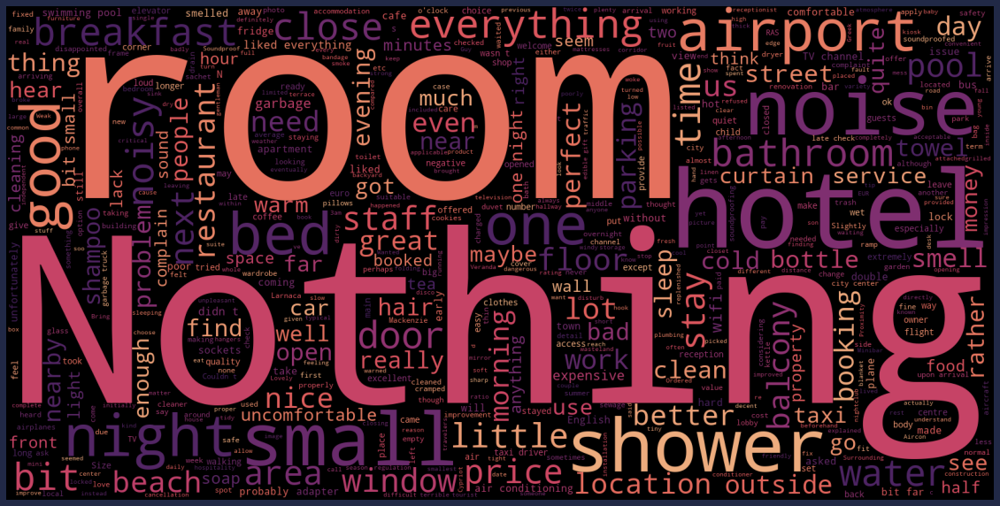

In [77]:
plt.figure(figsize=(20,20))
Word_Cloud_2 = WordCloud(max_words=1000, min_font_size=10,height=800,width=1600,background_color='black', colormap='flare').generate(' '.join(df['NegativeReview']))
plt.imshow(Word_Cloud_2)
plt.axis('off')
plt.show()

In [78]:
X_train, X_test, y_train, y_test = train_test_split(df['PositiveReview'], df['Score'], test_size=0.2)

In [79]:
tfid = TfidfVectorizer()
train_tfid_matrix = tfid.fit_transform(X_train)
test_tfid_matrix = tfid.transform(X_test)

In [80]:
pickle.dump(tfid, open('tfidf.pkl', 'wb'))

In [81]:
models = [DecisionTreeClassifier(),
          RandomForestClassifier(),
          SVC(),
          LogisticRegression(max_iter=1000),
          KNeighborsClassifier(),
          BernoulliNB()]

In [82]:
accuracy = []

for model in models:
    cross_val = cross_val_score(model, train_tfid_matrix, y_train, scoring='accuracy',
                               cv=StratifiedKFold(10)).mean()
    accuracy.append(cross_val)

In [83]:
models_name = ['DecisionTreeClassifier', 'RandomForestClassifier', 'SVC',
         'LogisticRegression', 'KNeighborsClassifier', 'BernoulliNB']
acc = pd.DataFrame({'Model': models_name, 'Accuracy': accuracy})
acc

,Model,Accuracy
0,DecisionTreeClassifier,0.972091
1,RandomForestClassifier,0.977842
2,SVC,0.977842
3,LogisticRegression,0.977842
4,KNeighborsClassifier,0.977842
5,BernoulliNB,0.958949


In [84]:
log = LogisticRegression(max_iter=1000)
log.fit(train_tfid_matrix, y_train)
pred = log.predict(test_tfid_matrix)

In [85]:
pickle.dump(log, open('ml_model.pkl', 'wb'))

In [86]:
ml = pickle.load(open('ml_model.pkl','rb'))
tfidf = pickle.load(open('tfidf.pkl','rb'))
def ml_predict(text):
    clean_text = cleaning(text)
    tfid_matrix = tfidf.transform([clean_text])
    pred_proba = ml.predict_proba(tfid_matrix)
    idx = np.argmax(pred_proba)
    pred = ml.classes_[idx]
    return pred, pred_proba[0][idx]
ml_predict('poor room service')

('good', 0.9713568735531186)

In [87]:
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[  0   1   0]
 [  0 302   0]
 [  0   2   0]]
              precision    recall  f1-score   support

         bad       0.00      0.00      0.00         1
        good       0.99      1.00      1.00       302
      netral       0.00      0.00      0.00         2

    accuracy                           0.99       305
   macro avg       0.33      0.33      0.33       305
weighted avg       0.98      0.99      0.99       305



In [88]:
X_train, X_test, y_train, y_test = train_test_split(df['NegativeReview'], df['Score'], test_size=0.2)

In [89]:
tfid = TfidfVectorizer()
train_tfid_matrix = tfid.fit_transform(X_train)
test_tfid_matrix = tfid.transform(X_test)

In [90]:
pickle.dump(tfid, open('tfidf.pkl', 'wb'))

In [91]:
models = [DecisionTreeClassifier(),
          RandomForestClassifier(),
          SVC(),
          LogisticRegression(max_iter=1000),
          KNeighborsClassifier(),
          BernoulliNB()]

In [92]:
accuracy = []

for model in models:
    cross_val = cross_val_score(model, train_tfid_matrix, y_train, scoring='accuracy',
                               cv=StratifiedKFold(10)).mean()
    accuracy.append(cross_val)

In [93]:
models_name = ['DecisionTreeClassifier', 'RandomForestClassifier', 'SVC',
         'LogisticRegression', 'KNeighborsClassifier', 'BernoulliNB']
acc = pd.DataFrame({'Model': models_name, 'Accuracy': accuracy})
acc

,Model,Accuracy
0,DecisionTreeClassifier,0.972903
1,RandomForestClassifier,0.980301
2,SVC,0.980301
3,LogisticRegression,0.980301
4,KNeighborsClassifier,0.980301
5,BernoulliNB,0.967999


In [94]:
log = LogisticRegression(max_iter=1000)
log.fit(train_tfid_matrix, y_train)
pred = log.predict(test_tfid_matrix)

In [95]:
pickle.dump(log, open('ml_model.pkl', 'wb'))

In [96]:
ml = pickle.load(open('ml_model.pkl','rb'))
tfidf = pickle.load(open('tfidf.pkl','rb'))
def ml_predict(text):
    clean_text = cleaning(text)
    tfid_matrix = tfidf.transform([clean_text])
    pred_proba = ml.predict_proba(tfid_matrix)
    idx = np.argmax(pred_proba)
    pred = ml.classes_[idx]
    return pred, pred_proba[0][idx]
ml_predict('poor room service')

('good', 0.9750267421803327)

In [97]:
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[  0   2   0]
 [  0 299   0]
 [  0   4   0]]
              precision    recall  f1-score   support

         bad       0.00      0.00      0.00         2
        good       0.98      1.00      0.99       299
      netral       0.00      0.00      0.00         4

    accuracy                           0.98       305
   macro avg       0.33      0.33      0.33       305
weighted avg       0.96      0.98      0.97       305



# Hi, thank you so much for reading to the end, i just recently started doing analytics and your advice and comments are important to me. Don't forget to upvote this notebook if you like it!